In [20]:

import glob
import os
import shutil

images_dir = r'C:\Users\Freedomkwok2022\ML_Learn\BYU\notebooks\cleaned\images\shared_009_cleaned\train'
labels_dir = images_dir.replace("images", "labels")
images = sorted(glob.glob(os.path.join(images_dir, '*.jpg'), recursive=True))

labels = set(sorted(glob.glob(os.path.join(labels_dir, '*.txt'), recursive=True)))

selected_labels_dir = images_dir.replace("cleaned", "selected").replace("images", "labels")

missing_labels = []
backfilled_labels = []
for i in images:
    expeceted_label_file = i.replace("images", "labels").replace("jpg", "txt")
    if expeceted_label_file not in labels:
        missing_labels.append(expeceted_label_file)
        missed_label_name = os.path.basename(i).replace("jpg", "txt")
        found_label_from_selected = os.path.join(selected_labels_dir.replace("shared_009_selected", "shared_007"), missed_label_name)
        if os.path.exists(found_label_from_selected):
            backfilled_labels.append(found_label_from_selected)
            if not os.path.exists(expeceted_label_file):
                shutil.copy(found_label_from_selected, expeceted_label_file)
        
        
print("Found labels", len(backfilled_labels))
print(len(missing_labels) , len(labels), len(images))
    
    

Found labels 0
6 6115 6121


### Data Copy shared_009_cleaned

In [46]:
import os
import shutil
import glob
import random

# Paths
labels_src = r"C:\Users\Freedomkwok2022\ML_Learn\BYU\notebooks\cleaned\labels\shared_009_cleaned\train"
images_src = r"C:\Users\Freedomkwok2022\ML_Learn\BYU\notebooks\cleaned\images\shared_009_cleaned\train"
base_dst = r"C:\Users\Freedomkwok2022\ML_Learn\BYU\yolo_dataset"

# Destination folders
labels_dst_train = os.path.join(base_dst, r"labels\shared_009_cleaned\train")
images_dst_train = os.path.join(base_dst, r"images\shared_009_cleaned\train")
labels_dst_val = os.path.join(base_dst, r"labels\shared_009_cleaned\val")
images_dst_val = os.path.join(base_dst, r"images\shared_009_cleaned\val")

# Ensure output directories exist
for path in [labels_dst_train, images_dst_train, labels_dst_val, images_dst_val]:
    os.makedirs(path, exist_ok=True)

# Match all target label files
patterns = ["*r090.txt", "*r100.txt", "*r070.txt"]
matched_labels = []
for pattern in patterns:
    matched_labels.extend(glob.glob(os.path.join(labels_src, pattern)))

# Shuffle and split
random.shuffle(matched_labels)
split_idx = int(len(matched_labels) * 0.97)
train_labels = matched_labels[:split_idx]
val_labels = matched_labels[split_idx:]

def process_file(label_path, is_train=True):
    filename = os.path.basename(label_path)

    if filename.endswith("r070.txt"):
        new_label_filename = filename.replace("r070.txt", "r090.txt")
        new_image_filename = filename.replace("r070.txt", "r090.jpg")
        original_image_filename = filename.replace(".txt", ".jpg")
    else:
        new_label_filename = filename
        new_image_filename = filename.replace(".txt", ".jpg")
        original_image_filename = new_image_filename

    # Destination paths
    label_dst_path = os.path.join(labels_dst_train if is_train else labels_dst_val, new_label_filename)
    image_src_path = os.path.join(images_src, original_image_filename)
    image_dst_path = os.path.join(images_dst_train if is_train else images_dst_val, new_image_filename)

    # Update label file content
    with open(label_path, 'r') as f:
        lines = f.readlines()

    updated_lines = []
    for line in lines:
        parts = line.strip().split()
        if len(parts) == 5:
            parts[3] = parts[4] = "0.09"
            updated_lines.append(" ".join(parts))
        else:
            updated_lines.append(line.strip())

    with open(label_dst_path, 'w') as f:
        f.write("\n".join(updated_lines) + "\n")

    # Copy image if exists
    if os.path.exists(image_src_path):
        shutil.copy2(image_src_path, image_dst_path)
    else:
        print(f"[Warning] Missing image: {image_src_path}")

# Process all
for label in train_labels:
    process_file(label, is_train=True)

for label in val_labels:
    process_file(label, is_train=False)

In [7]:
import os
import glob

labels_src = r"C:\Users\Freedomkwok2022\ML_Learn\BYU\notebooks\cleaned\labels\shared_009_cleaned\train"

# Get all .txt files
label_files = glob.glob(os.path.join(labels_src, "*.txt"))

for file_path in label_files:
    with open(file_path, 'r') as f:
        lines = f.readlines()

    # Modify each line's last two columns
    modified_lines = []
    for line in lines:
        parts = line.strip().split()
        if len(parts) == 5:
            parts[3] = "0.09"  # width
            parts[4] = "0.09"  # height
            modified_lines.append(" ".join(parts))
        else:
            modified_lines.append(line.strip())  # Keep unmodified if not exactly 5 columns

    # Overwrite the file with updated lines
    with open(file_path, 'w') as f:
        f.write("\n".join(modified_lines) + "\n")

print("All label files updated with width and height = 0.09.")

All label files updated with width and height = 0.09.


In [26]:
# Image source directory
images_src = r"C:\Users\Freedomkwok2022\ML_Learn\BYU\notebooks\cleaned\images\shared_009_cleaned\train"

image_exists = sum(
    os.path.exists(os.path.join(images_src, os.path.splitext(os.path.basename(label))[0] + ".jpg"))
    for label in matched_labels
)

print(f"Matching image files found: {image_exists}")

Matching image files found: 4879


In [4]:
import os
import glob
import re
from collections import Counter

labels_src = r"C:\Users\Freedomkwok2022\ML_Learn\BYU\notebooks\cleaned\labels\shared_009_cleaned\train"

# Match all .txt label files
label_files = glob.glob(os.path.join(labels_src, "*.txt"))

# Extract rXXXX values using regex
r_pattern = re.compile(r'_r(\d{3})\.txt$')
r_counts = Counter()

for filepath in label_files:
    filename = os.path.basename(filepath)
    match = r_pattern.search(filename)
    if match:
        r_value = f"r{match.group(1)}"
        r_counts[r_value] += 1

# Print summary
print("Found the following RXXXX types in shared_009:")
for r_value, count in sorted(r_counts.items()):
    print(f"{r_value}: {count} files")


Found the following RXXXX types in shared_009:
r070: 1801 files
r090: 1982 files
r100: 1096 files
r110: 328 files
r120: 259 files
r130: 236 files
r140: 245 files
r150: 223 files
r160: 168 files
r170: 131 files
r180: 135 files
r190: 57 files
r200: 80 files
r210: 62 files
r220: 51 files
r230: 58 files
r240: 19 files
r250: 15 files
r260: 41 files
r270: 43 files
r280: 27 files
r290: 12 files
r300: 13 files
r310: 4 files
r320: 3 files
r330: 3 files
r340: 5 files
r350: 1 files
r370: 18 files
r380: 8 files
r390: 18 files
r400: 16 files
r420: 25 files
r440: 4 files


In [ ]:
import os
import shutil
import glob

# Paths
labels_src = r"C:\Users\Freedomkwok2022\ML_Learn\BYU\notebooks\cleaned\labels\shared_009_cleaned\train"
images_src = r"C:\Users\Freedomkwok2022\ML_Learn\BYU\notebooks\cleaned\images\shared_009_cleaned\train"
labels_dst = r"C:\Users\Freedomkwok2022\ML_Learn\BYU\yolo_dateset\labels\shared_009_cleaned\train"
images_dst = r"C:\Users\Freedomkwok2022\ML_Learn\BYU\yolo_dateset\images\shared_009_cleaned\train"

# Create destination directories if they don't exist
os.makedirs(labels_dst, exist_ok=True)
os.makedirs(images_dst, exist_ok=True)

# Pattern match for labels
patterns = ["*r090.txt", "*r100.txt", "r070.txt"]

# Collect matching label files
matched_labels = []
for pattern in patterns:
    matched_labels.extend(glob.glob(os.path.join(labels_src, pattern)))

# Copy matching label and corresponding image
for label_path in matched_labels:
    filename = os.path.basename(label_path)
    image_name = os.path.splitext(filename)[0] + ".jpg"
    image_path = os.path.join(images_src, image_name)

    # Copy label
    shutil.copy2(label_path, os.path.join(labels_dst, filename))

    # Copy image if it exists
    if os.path.exists(image_path):
        shutil.copy2(image_path, os.path.join(images_dst, image_name))
    else:
        print(f"[Warning] Image not found: {image_path}")


In [44]:
import os
import glob
import random
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image, ImageDraw
import subprocess  # to open files
import math
from typing import List
import os
global local_dev
if "WANDB_API_KEY" in os.environ:
    local_dev =  "/workspace/BYU/notebooks"  
elif os.path.exists("/Applications"):
    local_dev = "/Users/freedomkwokmacbookpro/Github/Kaggle/BYU/notebooks"
else:
    local_dev = "C:/Users/Freedomkwok2022/ML_Learn/BYU/notebooks"

yolo_dataset_dir = os.path.join(local_dev, 'yolo_dataset')
yolo_weights_dir = os.path.join(local_dev, 'yolo_weights')
yolo_inputs_dir = os.path.join("C:/Users/Freedomkwok2022/ML_Learn/BYU", 'input')

import plotly.express as px
from PIL import Image, ImageDraw
import random
import seaborn as sns
from matplotlib.patches import Rectangle
from ultralytics import YOLO
import yaml
import json
import os
import glob
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
from sklearn.model_selection import train_test_split
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torch.optim.lr_scheduler import ReduceLROnPlateau
import cv2
import threading
import time
from contextlib import nullcontext
from concurrent.futures import ThreadPoolExecutor
import math

np.random.seed(42)
random.seed(42)
torch.manual_seed(42)

# Create the weights directory if it does not exist
os.makedirs(yolo_weights_dir, exist_ok=True)

output_location = "/kaggle/working"
output_location = local_dev


import cv2
import numpy as np
import random
from PIL import Image
from scipy.stats import entropy

def image_entropy(img_path):
    img = Image.open(img_path).convert("L")
    hist = img.histogram()
    hist = [float(h) / sum(hist) for h in hist if h != 0]
    return entropy(hist)

def is_low_info_image(image_path, threshold=50):
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    if image is None:
        raise FileNotFoundError(f"Cannot read: {image_path}")
    variance = cv2.Laplacian(image, cv2.CV_64F).var()
    return variance < threshold, variance

def is_static_noise_image(image_path, edge_thresh=60, hist_std_thresh=1000):
    img = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    if img is None:
        raise FileNotFoundError(f"Cannot read: {image_path}")
    
    edges = cv2.Canny(img, 100, 200)
    edge_ratio = (edges > 0).sum() / edges.size * 100

    hist = cv2.calcHist([img], [0], None, [256], [0, 256]).flatten()
    hist_std = np.std(hist)

    is_useless = edge_ratio > edge_thresh and hist_std > hist_std_thresh
    return is_useless, {"edge_ratio": edge_ratio, "hist_std": hist_std}

def is_useless_image(image_path, random_pass_chance=0):
    # Laplacian-based low-info check
    low_info, lap_score = is_low_info_image(image_path, threshold=50)
    
    # Entropy check
    ent_score = image_entropy(image_path)
    
    # Static noise check
    static_noise, static_info = is_static_noise_image(image_path)

    # Combine all criteria
    decision = low_info or ent_score > 7.0 or static_noise

    # Apply random pass override
    if decision and random.random() < random_pass_chance:
        decision = False
        static_info["random_pass_override"] = True
    else:
        static_info["random_pass_override"] = False

    return decision, {
        "low_info": low_info,
        "laplacian_var": lap_score,
        "entropy": ent_score,
        "static_noise": static_noise,
        "edge_ratio": static_info["edge_ratio"],
        "hist_std": static_info["hist_std"],
        "random_pass_override": static_info["random_pass_override"]
    }
def find_files_with_matching_prefix(input_path: str) -> List[str]:
    folder, filename = os.path.split(input_path)

    # Extract prefix using regex up to `_zXXXX`
    match = re.match(r"(BYU_\d+_\d+_tomo_[^_]+_z\d{4})", filename)
    if not match:
        raise ValueError(f"Could not extract BYU prefix from filename: {filename}")

    prefix = match.group(1)

    # Match all files in the folder with the same prefix
    matching_files = [
        os.path.join(folder, f) for f in os.listdir(folder)
        if f.startswith(prefix)
    ]

    return matching_files


def visualize_random_training_samples(images_train_dir, labels_train_dir, num_samples=4, rows=2, original_dataset = None):
    """
    Visualize random training samples with YOLO annotations and clickable images.

    Args:
        images_train_dir (str): Directory containing training images
        labels_train_dir (str): Directory containing corresponding YOLO label .txt files
        num_samples (int): Number of random images to display
        rows (int): Number of rows in the output grid
    """

    image_files = []
    for ext in ['*.jpg', '*.jpeg', '*.png']:
        image_files.extend(glob.glob(os.path.join(images_train_dir, "**", ext), recursive=True))

    if len(image_files) == 0:
        print("No image files found!")
        return

    num_samples = min(num_samples, len(image_files))
    selected_images = random.sample(image_files, num_samples)

    cols = math.ceil(num_samples / rows)
    fig, axes = plt.subplots(rows, cols, figsize=(5 * cols, 5 * rows))
    axes = np.array(axes).reshape(-1)  # flatten even if rows=1

    # Store which file each axis belongs to
    ax_to_file = {}
    img_paths = []  
    all_paths = []
    for i, (ax, img_path) in enumerate(zip(axes, selected_images)):
        try:
            relative_path = os.path.relpath(img_path, images_train_dir)
            label_path = os.path.join(labels_train_dir, os.path.splitext(relative_path)[0] + '.txt')

            all_paths.append(relative_path)
            all_paths.append(label_path)
            img = Image.open(img_path)
            img_width, img_height = img.size
            img_paths.append(img_path)
            
            img_array = np.array(img)
            p2, p98 = np.percentile(img_array, 2), np.percentile(img_array, 98)
            normalized = np.clip(img_array, p2, p98)
            normalized = 255 * (normalized - p2) / (p98 - p2)
            img_normalized = Image.fromarray(np.uint8(normalized)).convert('RGB')

            overlay = Image.new('RGBA', img_normalized.size, (0, 0, 0, 0))
            draw = ImageDraw.Draw(overlay)

            annotations = []
            if os.path.exists(label_path):
                with open(label_path, 'r') as f:
                    for line in f:
                        class_id, x_c, y_c, w, h = map(float, line.strip().split())
                        annotations.append({
                            'class_id': int(class_id),
                            'x_center': x_c * img_width,
                            'y_center': y_c * img_height,
                            'width': w * img_width,
                            'height': h * img_height,
                        })

            def runFile(foundPath):
                with open(foundPath, 'r') as f:
                    for line in f:
                        class_id, x_c, y_c, w, h = map(float, line.strip().split())
                        annotations.append({
                            'class_id': int(class_id),
                            'x_center': x_c * img_width,
                            'y_center': y_c * img_height,
                            'width': w * img_width,
                            'height': h * img_height,
                            'origin': True
                        })

            if original_dataset:  
                newPath = label_path.replace(original_dataset[0], original_dataset[1])       
                if os.path.exists(newPath):
                    runFile(newPath)
                else:
                    paths = find_files_with_matching_prefix(newPath)
                    runFile(paths[0])
                    
                            
            for ann in annotations:
                x1 = max(0, int(ann['x_center'] - ann['width']/2))
                y1 = max(0, int(ann['y_center'] - ann['height']/2))
                x2 = min(img_width, int(ann['x_center'] + ann['width']/2))
                y2 = min(img_height, int(ann['y_center'] + ann['height']/2))
                fill = (0, 0, 255, 64) if "origin" in ann else (255, 0, 0, 64)
                outline = (0, 0, 255, 255) if "origin" in ann else (255, 0, 0, 255)
                draw.rectangle([x1, y1, x2, y2], fill=fill, outline=outline)
                # draw.text((x1, y1-10), f"Class {ann['class_id']}", fill=(255, 0, 0, 255))               

            # if not annotations:
            #     draw.text((10, 10), "No annotations found", fill=(255, 0, 0, 255))

            annotated_img = Image.alpha_composite(img_normalized.convert('RGBA'), overlay).convert('RGB')
            ax.imshow(annotated_img)
            ax.set_title(f"{os.path.basename(img_path)}\n({len(annotations)} annotations)", fontsize=9)
            ax.axis('off')
            ax_to_file[ax] = img_path

        except Exception as e:
            print(f"Error processing {img_path}: {e}")
            ax.axis('off')

    # Hide any unused axes
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()

    # Connect click event to open in File Explorer
    plt.show()
    for i in all_paths:
        print(i)
    # for i, path in enumerate(img_paths):
    #     print(f'{is_useless_image(path)}')
    #     print(os.path.join(local_dev, path))
        # print(f"{i:02d} " +  os.path.join(images_train_dir, path) + '\n')


### Verify file name

In [21]:
import os
from pathlib import Path

images_dir = Path(r"C:\Users\Freedomkwok2022\ML_Learn\BYU\notebooks\cleaned\images\shared_009_cleaned\train")
labels_dir = Path(r"C:\Users\Freedomkwok2022\ML_Learn\BYU\notebooks\cleaned\labels\shared_009_cleaned\train")

# Get base names without extensions
image_files = {f.stem for f in images_dir.glob("*.jpg")}
label_files = {f.stem for f in labels_dir.glob("*.txt")}

# Find mismatches
images_without_labels = image_files - label_files
labels_without_images = label_files - image_files

# Print results
print(f"Total Image {len(image_files)}")
print(f"=== Images without corresponding labels {len(images_without_labels)}===")
for stem in sorted(images_without_labels):
    print(images_dir / f"{stem}.jpg")

print(f"\n=== Labels without corresponding images {len(labels_without_images)}===")
for stem in sorted(labels_without_images):
    print(labels_dir / f"{stem}.txt")

Total Image 7193
=== Images without corresponding labels 6===
C:\Users\Freedomkwok2022\ML_Learn\BYU\notebooks\cleaned\images\shared_009_cleaned\train\BYU_007_100_tomo_1ab322_z0065_y0580_x0583_w0928_h0960_r0750.jpg
C:\Users\Freedomkwok2022\ML_Learn\BYU\notebooks\cleaned\images\shared_009_cleaned\train\BYU_cryoet2_007_aba2014-02-21-6_z0225_y0297_x0250_w0960_h0928_r0750.jpg
C:\Users\Freedomkwok2022\ML_Learn\BYU\notebooks\cleaned\images\shared_009_cleaned\train\BYU_cryoet2_007_aba2014-03-04-11_z0384_y0624_x0568_w0928_h0928_r0750.jpg
C:\Users\Freedomkwok2022\ML_Learn\BYU\notebooks\cleaned\images\shared_009_cleaned\train\BYU_cryoet2_007_aba2014-03-04-11_z0385_y0624_x0568_w0928_h0928_r0750.jpg
C:\Users\Freedomkwok2022\ML_Learn\BYU\notebooks\cleaned\images\shared_009_cleaned\train\BYU_cryoet2_007_aba2014-03-04-11_z0387_y0624_x0568_w0928_h0928_r0750.jpg
C:\Users\Freedomkwok2022\ML_Learn\BYU\notebooks\cleaned\images\shared_009_cleaned\train\BYU_cryoet2_007_aba2014-03-04-11_z0388_y0624_x0568_w092

In [25]:
import os
import glob
import re
from collections import Counter

labels_src =  Path(r"C:\Users\Freedomkwok2022\ML_Learn\BYU\yolo_dataset\labels\shared_009_cleaned\train")

# Match all .txt label files
label_files = glob.glob(os.path.join(labels_src, "*.txt"))

# Extract rXXXX values using regex
r_pattern = re.compile(r'_r(\d{3})\.txt$')
r_counts = Counter()

for filepath in label_files:
    filename = os.path.basename(filepath)
    match = r_pattern.search(filename)
    if match:
        r_value = f"r{match.group(1)}"
        r_counts[r_value] += 1

# Print summary
print("Found the following RXXXX types in shared_009:")
for r_value, count in sorted(r_counts.items()):
    print(f"{r_value}: {count} files")


Found the following RXXXX types in shared_009:
r090: 3783 files
r100: 1096 files


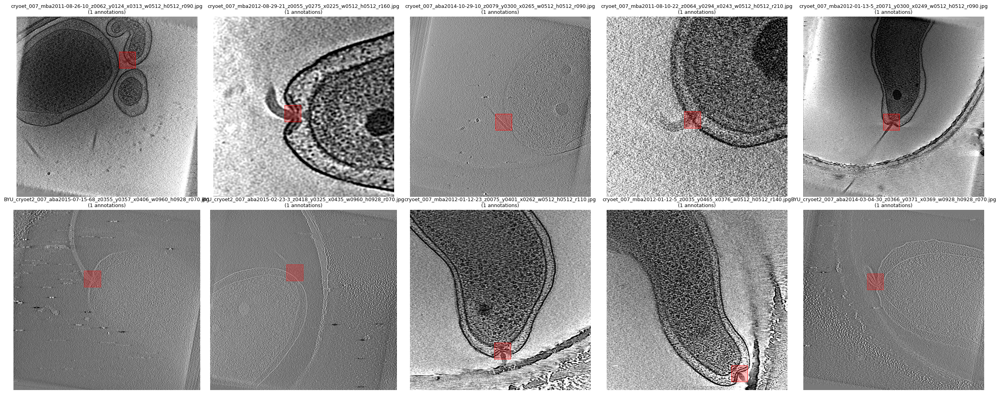

(False, {'low_info': False, 'laplacian_var': 21216.4070222741, 'entropy': 5.450713979625855, 'static_noise': False, 'edge_ratio': 34.71527099609375, 'hist_std': 472.51672, 'random_pass_override': False})
C:\Users\Freedomkwok2022\ML_Learn\BYU\notebooks\cleaned\images\shared_009_cleaned\train\cryoet_007_mba2011-08-26-10_z0062_y0124_x0313_w0512_h0512_r090.jpg
(False, {'low_info': False, 'laplacian_var': 150.25797756103566, 'entropy': 5.413966555858291, 'static_noise': False, 'edge_ratio': 13.488388061523438, 'hist_std': 522.48145, 'random_pass_override': False})
C:\Users\Freedomkwok2022\ML_Learn\BYU\notebooks\cleaned\images\shared_009_cleaned\train\cryoet_007_mba2012-08-29-21_z0055_y0275_x0225_w0512_h0512_r160.jpg
(False, {'low_info': False, 'laplacian_var': 87168.13151611543, 'entropy': 5.3521975210680575, 'static_noise': False, 'edge_ratio': 31.23321533203125, 'hist_std': 640.02515, 'random_pass_override': False})
C:\Users\Freedomkwok2022\ML_Learn\BYU\notebooks\cleaned\images\shared_009

In [42]:
# # Run the visualization
images_dir = Path(r"C:\Users\Freedomkwok2022\ML_Learn\BYU\notebooks\cleaned\images\shared_009_cleaned\train")
labels_dir = Path(r"C:\Users\Freedomkwok2022\ML_Learn\BYU\notebooks\cleaned\labels\shared_009_cleaned\train")
visualize_random_training_samples(images_dir, labels_dir, 10, 2)

## Dynamic _dataset

In [31]:
import os
import shutil
import glob
import re
import random

# === Paths ===
labels_src = r"C:\Users\Freedomkwok2022\ML_Learn\BYU\notebooks\cleaned\labels\shared_009_cleaned\train"
images_src = r"C:\Users\Freedomkwok2022\ML_Learn\BYU\notebooks\cleaned\images\shared_009_cleaned\train"
base_dst = r"C:\Users\Freedomkwok2022\ML_Learn\BYU\yolo_dataset"

# === Ensure destination folders exist ===
for split in ["train", "val"]:
    os.makedirs(os.path.join(base_dst, f"labels/shared_dyn/{split}"), exist_ok=True)
    os.makedirs(os.path.join(base_dst, f"images/shared_dyn/{split}"), exist_ok=True)

# === rXXX mapping logic ===
def map_group(original_r):
    r_val = int(original_r)
    if 70 <= r_val <= 100:
        return "090", "0.09"
    elif 110 <= r_val <= 160:
        return "140", "0.14"
    elif 170 <= r_val <= 260:
        return "230", "0.23"
    elif 270 <= r_val <= 440:
        return "340", "0.34"
    return None, None

# === Collect valid entries ===
r_pattern = re.compile(r"_r(\d{3})\.txt$")
entries = []

for label_path in glob.glob(os.path.join(labels_src, "*.txt")):
    base = os.path.basename(label_path)
    match = r_pattern.search(base)
    if not match:
        continue

    original_r = match.group(1)
    new_r, new_wh = map_group(original_r)
    if not new_r:
        continue

    # New filenames with rNEW_oOLD format
    new_base_name = base.replace(f"_r{original_r}.txt", f"_r{new_r}_o{original_r}.txt")
    new_image_name = new_base_name.replace(".txt", ".jpg")
    original_image_name = base.replace(".txt", ".jpg")

    image_src_path = os.path.join(images_src, original_image_name)
    if os.path.exists(image_src_path):
        entries.append({
            "label_src": label_path,
            "image_src": image_src_path,
            "label_dst_name": new_base_name,
            "image_dst_name": new_image_name,
            "wh_value": new_wh,
        })

# === Train/Val split ===
random.shuffle(entries)
split_idx = int(len(entries) * 0.97)
train_entries = entries[:split_idx]
val_entries = entries[split_idx:]

print(f"Total: {len(entries)} | Train: {len(train_entries)} | Val: {len(val_entries)}")

# === Copy function ===
def copy_and_rewrite(entry, split):
    label_dst = os.path.join(base_dst, f"labels/shared_dyn/{split}", entry["label_dst_name"])
    image_dst = os.path.join(base_dst, f"images/shared_dyn/{split}", entry["image_dst_name"])

    # Rewrite label with updated width/height
    with open(entry["label_src"], "r") as f:
        lines = f.readlines()

    updated = []
    for line in lines:
        parts = line.strip().split()
        if len(parts) == 5:
            parts[3], parts[4] = entry["wh_value"], entry["wh_value"]
            updated.append(" ".join(parts))
        else:
            updated.append(line.strip())

    with open(label_dst, "w") as f:
        f.write("\n".join(updated) + "\n")

    shutil.copy2(entry["image_src"], image_dst)

# === Execute copy for both splits ===
for e in train_entries:
    copy_and_rewrite(e, "train")

for e in val_entries:
    copy_and_rewrite(e, "val")


Total: 7187 | Train: 6971 | Val: 216


In [36]:
import os
import glob
import re
from collections import Counter

labels_src =  Path(r"C:\Users\Freedomkwok2022\ML_Learn\BYU\yolo_dataset\labels\shared_dyn\train")

# Match all .txt label files
label_files = glob.glob(os.path.join(labels_src, "*.txt"))

# Extract rXXXX values using regex
r_pattern = re.compile(r'_r(\d{3})\.txt$')
r_counts = Counter()

for filepath in label_files:
    filename = os.path.basename(filepath)
    match = r_pattern.search(filename)
    if match:
        r_value = f"r{match.group(1)}"
        r_counts[r_value] += 1

# Print summary
print("Found the following RXXXX types in shared_009:")
for r_value, count in sorted(r_counts.items()):
    print(f"{r_value}: {count} files")


Found the following RXXXX types in shared_009:


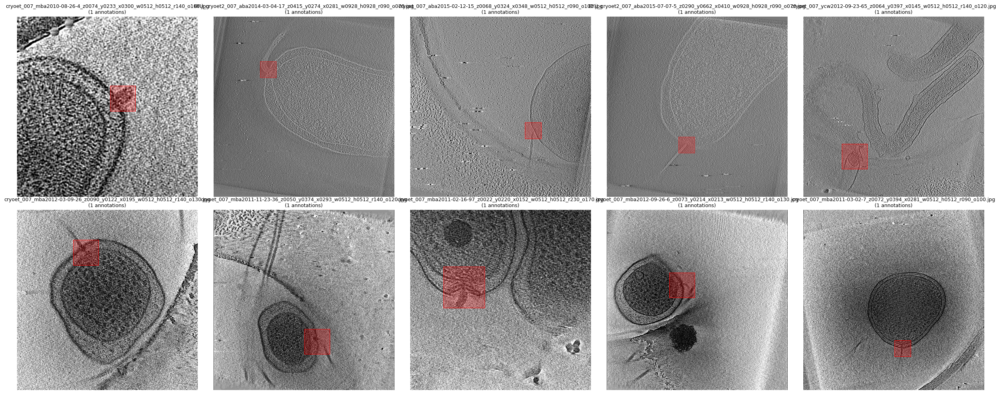

(False, {'low_info': False, 'laplacian_var': 998.249445765221, 'entropy': 5.42427681917974, 'static_noise': False, 'edge_ratio': 32.60498046875, 'hist_std': 504.3377, 'random_pass_override': False})
C:\Users\Freedomkwok2022\ML_Learn\BYU\yolo_dataset\images\shared_dyn\train\cryoet_007_mba2010-08-26-4_z0074_y0233_x0300_w0512_h0512_r140_o160.jpg
(False, {'low_info': False, 'laplacian_var': 42680.21099564792, 'entropy': 5.304631429437376, 'static_noise': False, 'edge_ratio': 36.47373848097503, 'hist_std': 2384.2366, 'random_pass_override': False})
C:\Users\Freedomkwok2022\ML_Learn\BYU\yolo_dataset\images\shared_dyn\train\BYU_cryoet2_007_aba2014-03-04-17_z0415_y0274_x0281_w0928_h0928_r090_o070.jpg
(False, {'low_info': False, 'laplacian_var': 71845.1088698165, 'entropy': 5.3505489124536325, 'static_noise': False, 'edge_ratio': 33.2275390625, 'hist_std': 642.0388, 'random_pass_override': False})
C:\Users\Freedomkwok2022\ML_Learn\BYU\yolo_dataset\images\shared_dyn\train\cryoet_007_aba2015-02-1

In [41]:
# # Run the visualization
images_dir = Path(r"C:\Users\Freedomkwok2022\ML_Learn\BYU\yolo_dataset\images\shared_dyn\train")
labels_dir = Path(r"C:\Users\Freedomkwok2022\ML_Learn\BYU\yolo_dataset\labels\shared_dyn\train")
visualize_random_training_samples(images_dir, labels_dir, 10, 2)

In [ ]:
import os
from pathlib import Path

images_dir = Path(r"C:\Users\Freedomkwok2022\ML_Learn\BYU\yolo_dataset\images\shared_dyn\train")
labels_dir = Path(r"C:\Users\Freedomkwok2022\ML_Learn\BYU\yolo_dataset\labels\shared_dyn\train")

# Get base names without extensions
image_files = {f.stem for f in images_dir.glob("*.jpg")}
label_files = {f.stem for f in labels_dir.glob("*.txt")}

# Find mismatches
images_without_labels = image_files - label_files
labels_without_images = label_files - image_files

# Print results
print(f"Total Image {len(image_files)}")
print(f"=== Images without corresponding labels {len(images_without_labels)}===")
for stem in sorted(images_without_labels):
    print(images_dir / f"{stem}.jpg")

print(f"\n=== Labels without corresponding images {len(labels_without_images)}===")
for stem in sorted(labels_without_images):
    print(labels_dir / f"{stem}.txt")

Total Image 6971
=== Images without corresponding labels 0===

=== Labels without corresponding images 0===


In [ ]:
import os
import shutil
from glob import glob

# Source directories
source_dirs = [
    "/workspace/BYU/notebooks/yolo_dataset/images/shared_009/",
    "/workspace/BYU/notebooks/yolo_dataset/images/shared_009_cleaned/"
]

# Destination directories
merged_image_dir = "/workspace/BYU/notebooks/yolo_dataset/images/shared_009_merged/"
merged_label_dir = merged_image_dir.replace("images", "labels")

# Ensure destination directories exist
os.makedirs(merged_image_dir, exist_ok=True)
os.makedirs(merged_label_dir, exist_ok=True)

# File copy loop
for source in source_dirs:
    image_paths = glob(os.path.join(source, "*.jpg"))
    for img_path in image_paths:
        basename = os.path.basename(img_path)
        label_path = img_path.replace("images", "labels").replace(".jpg", ".txt")

        # Copy image
        shutil.copy(img_path, os.path.join(merged_image_dir, basename))

        # Copy label if it exists
        if os.path.exists(label_path):
            shutil.copy(label_path, os.path.join(merged_label_dir, os.path.basename(label_path)))
        else:
            print(f"Warning: Label not found for {basename}")

print("✅ Merging complete.")


In [ ]:
import os
from pathlib import Path

images_dir = Path(r"/workspace/BYU/notebooks/yolo_dataset/images/shared_009_merged/train")
labels_dir = Path(r"/workspace/BYU/notebooks/yolo_dataset/labels/shared_009_merged/train")

# Get base names without extensions
image_files = {f.stem for f in images_dir.glob("*.jpg")}
label_files = {f.stem for f in labels_dir.glob("*.txt")}

# Find mismatches
images_without_labels = image_files - label_files
labels_without_images = label_files - image_files

# Print results
print(f"Total Image {len(image_files)}")
print(f"=== Images without corresponding labels {len(images_without_labels)}===")
for stem in sorted(images_without_labels):
    print(images_dir / f"{stem}.jpg")

print(f"\n=== Labels without corresponding images {len(labels_without_images)}===")
for stem in sorted(labels_without_images):
    print(labels_dir / f"{stem}.txt")

In [ ]:
import os
from pathlib import Path

image_root = Path("/workspace/BYU/notebooks/yolo_dataset/images/shared_009_merged")
label_root = Path("/workspace/BYU/notebooks/yolo_dataset/labels/shared_009_merged")

# Collect all image and label stems across both train and val
image_files = {f.stem: f for f in image_root.rglob("*.jpg")}
label_files = {f.stem: f for f in label_root.rglob("*.txt")}

# Find mismatches
image_stems = set(image_files.keys())
label_stems = set(label_files.keys())

images_without_labels = image_stems - label_stems
labels_without_images = label_stems - image_stems

# Report
print(f"Total Images: {len(image_stems)}")
print(f"Total Labels: {len(label_stems)}")

print(f"\n=== Images without corresponding labels ({len(images_without_labels)}) ===")
for stem in sorted(images_without_labels):
    print(image_files[stem])

print(f"\n=== Labels without corresponding images ({len(labels_without_images)}) ===")
for stem in sorted(labels_without_images):
    print(label_files[stem])
